In [354]:
import pickle
from sklearn import pipeline, preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn import linear_model
from sklearn import ensemble
from sklearn import model_selection
from sklearn.base import BaseEstimator, TransformerMixin
from gensim.summarization import summarize
from gensim import corpora, models, similarities, matutils
from gensim.summarization import keywords
import spacy
from spacy.attrs import ENT_IOB, ENT_TYPE
import matplotlib.pyplot as plt
from sklearn import neighbors
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.decomposition import PCA
import textwrap
from sklearn.metrics.pairwise import cosine_distances
import math
import numpy as np
import pandas as pd
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
with open('list_pg_all.pkl', 'rb') as f:
    train = pickle.load(f)

In [4]:
train

['',
 'UNITED STATES ENVIRONMENTAL PROTECTION AGENCY \nREGION 4 ATLANTA FEDERAL CENTER 61 FORSYTH STREET ATLANTA, GEORGIA \n30303-8960 CERTIFIED MAIL RETURN RECEIPT REQUESTED Ms. Birdie \nSimms, Office Manager Kelcas Petroleum Production \n& Exploration P.O. Box 21345 Owensboro, KY 2304 SUBJ: Consent Agreement \nand Final \nOrder: Docket No. CWA-04-2007-5002 Dear Ms. Simms: Enclosed is a copy \nof the Consent Agreement and Final \nOrder (CAFO) \nfor the \nabove referenced matter. \nThis CAFO became effective on the date of filing with. the \nRegional Hearing \nClerk as required by 40 C.F.R.sg22.6 and 22.31, and as indicated \non the Certificate of Service. The United States Environmental Protection \nAgency (EPA) hereby notifies \nyou that the Expedited Settlement Agreement \nhas been \nexecuted by both parties and \nis binding on \nEPA and you. Upon \nreceipt of your assessed \npenalty of $500.00, EPA will \ntake no further action against \nyou for the \nviolations cited in the Settle

In [7]:
count_vectorizer = CountVectorizer(ngram_range=(1, 2),  
                                   stop_words='english', token_pattern="\\b[a-z][a-z]+\\b")
count_vectorizer.fit(train)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 2), preprocessor=None, stop_words='english',
        strip_accents=None, token_pattern='\\b[a-z][a-z]+\\b',
        tokenizer=None, vocabulary=None)

In [4]:
len(train)

11553

In [5]:
train_smol = train[0:101]

In [98]:
count_vectorizer = CountVectorizer(ngram_range=(1, 3),  
                                   stop_words='english', token_pattern="\\b[a-z][a-z]+\\b")
count_vectorizer.fit(train_smol)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 3), preprocessor=None, stop_words='english',
        strip_accents=None, token_pattern='\\b[a-z][a-z]+\\b',
        tokenizer=None, vocabulary=None)

In [99]:
# Create the term-document matrix
# Transpose it so the terms are the rows
counts_transpose = count_vectorizer.transform(train_smol).transpose()
counts = count_vectorizer.transform(train_smol)

In [9]:
counts

<42585x101 sparse matrix of type '<class 'numpy.int64'>'
	with 82043 stored elements in Compressed Sparse Column format>

In [100]:
smol_transformed_dense = counts.todense()

In [101]:
df = pd.DataFrame(smol_transformed_dense, columns=[count_vectorizer.get_feature_names()])

In [102]:
df.sample(15)

,aa,aa federal,aa federal debt,aaa,aaa plating,aaa plating docket,aaa plating inopeetion,aaa plating inspection,aaaessed,aaaessed day,...,zones operating teams,zoos,zoos distribution,zoos distribution judicial,ztq,ztq karina,ztq karina borromeo,zvt,zvt signaturebycomplainant,zvt signaturebycomplainant date
97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
91,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
99,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
82,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
55,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## DBSCAN original smol counts

In [351]:
dbscan_train_smol = DBSCAN(eps = 50, metric=cosine_distances) #REDO w/ COSINE

In [355]:
y_db = dbscan_train_smol.fit_predict(smol_transformed_dense)

In [200]:
core_samples_mask = np.zeros_like(dbscan_train_smol.labels_, dtype=bool)
core_samples_mask[dbscan_train_smol.core_sample_indices_] = True
labels = dbscan_train_smol.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)
print(labels)

Estimated number of clusters: 1
[ 0 -1  0 -1  0  0 -1 -1 -1  0  0 -1 -1 -1 -1  0 -1  0  0  0  0  0 -1  0  0
  0 -1  0  0 -1 -1  0 -1  0  0 -1  0 -1  0  0  0  0 -1 -1  0  0  0 -1 -1  0
  0 -1  0 -1 -1  0  0 -1 -1 -1 -1 -1  0 -1  0  0  0  0  0 -1  0 -1 -1 -1 -1
 -1 -1 -1  0  0  0 -1  0  0  0  0  0  0 -1 -1  0 -1  0  0 -1  0  0  0 -1 -1
 -1]


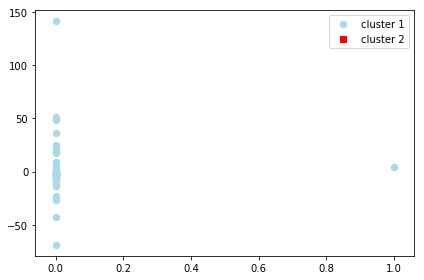

In [356]:
plt.scatter(smol_transformed_dense[y_db == 0, 0], smol_pca[y_db == 0, 1],
            c='lightblue', marker='o', s=40,
            label='cluster 1')
plt.scatter(smol_transformed_dense[y_db == 1, 0], smol_pca[y_db == 1, 1],
            c='red', marker='s', s=40,
            label='cluster 2')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
plt.scatter(smol_transformed_dense[y_db == 0, 0], smol_chunks_x_pca[y_dbs_s_c_p == 0, 1],
            c='lightblue', marker='o', s=40,
            label='cluster 1')
plt.scatter(smol_transformed_dense[y_db == 1, 0], smol_chunks_x_pca[y_dbs_s_c_p == 1, 1],
            c='red', marker='s', s=40,
            label='cluster 2')
plt.scatter(smol_transformed_dense[y_db == 2, 0], smol_chunks_x_pca[y_dbs_s_c_p == 2, 1],
            c='green', marker='o', s=40,
            label='cluster 3')
plt.scatter(smol_transformed_dense[y_dbs_s_c_p == 3, 0], smol_chunks_x_pca[y_dbs_s_c_p == 3, 1],
            c='purple', marker='s', s=40,
            label='cluster 4')
plt.legend()
plt.tight_layout()
plt.show()

## PCA original smol counts

In [219]:
def make_pca(dense_matrix, n):
    data_centered = dense_matrix - dense_matrix.mean()
    pca_obj = PCA(n_components=n)
    x_pca = pca_obj.fit_transform(data_centered)
    return x_pca, pca_obj

In [128]:
n_samples = smol_centered.shape[0]
n_features = smol_centered.shape[1]
n_features

84951

In [133]:
pca = PCA(n_components=10)

In [225]:
smol_pca, smol_pca_obj = make_pca(smol_transformed_dense, 10)

In [227]:
def exp_var_bar(pca_obj, n):
# Generate a figure with figsize=(20,5)
    digits_bar = plt.figure(figsize=(20, 5)) 
# Generate axes via add_subplot
    ax = digits_bar.add_subplot(111)
# Call ax.bar on the appropriate x and y to generate a bar graph of the explained variance for each component
    p1 = ax.bar(range(1,n+1), pca_obj.explained_variance_ratio_, 0.35)
    ax.set_title("Explained variance", size=32)
    ax.set_ylabel("Percent explained", size=24)
    ax.set_xlabel("Principal Component", size=24);

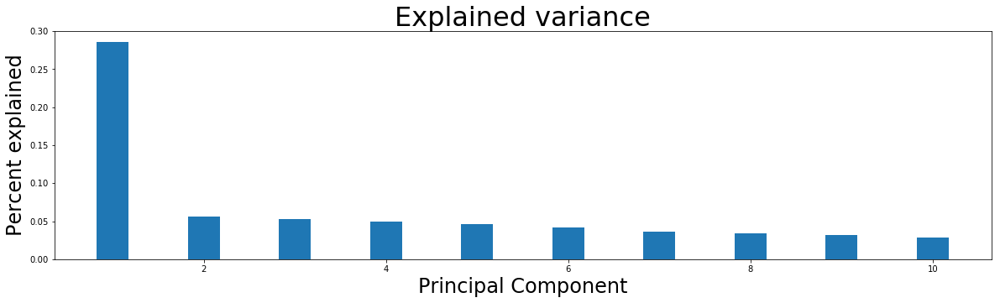

In [229]:
exp_var_bar(smol_pca_obj, 10)

In [232]:
transposed = smol_pca.T

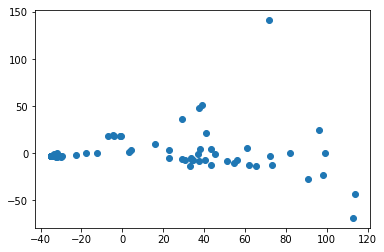

In [233]:
plt.scatter(transposed[0], transposed[1])

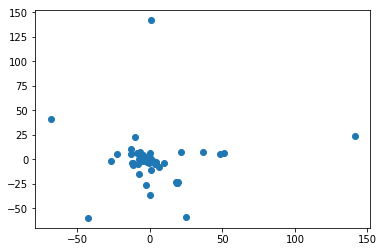

In [234]:
plt.scatter(transposed[1], transposed[2])

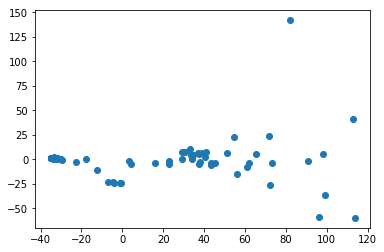

In [235]:
plt.scatter(transposed[0], transposed[2])

## Clustering on PCA- smol

In [142]:
smol_pca.shape

(101, 10)

In [181]:
dbscan_smol_pca = DBSCAN(eps = 50, metric='euclidean') #REDO w/ COSINE

In [182]:
y_db = dbscan_smol_pca.fit_predict(smol_pca)

In [183]:
core_samples_mask = np.zeros_like(dbscan_smol_pca.labels_, dtype=bool)
core_samples_mask[dbscan_smol_pca.core_sample_indices_] = True
labels = dbscan_smol_pca.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)
print(labels)

Estimated number of clusters: 2
[ 0  0  0  0  0  0 -1  0  0  0  0  0  0 -1  0  0 -1  0  0  0  0  0  0  0  0
  0  1  0  0  0 -1  0  0  0  0 -1  0  1  0  0  0  0 -1  0  0  0  0  0 -1  0
  0  1  0 -1  0  0  0 -1  0  1  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 -1]


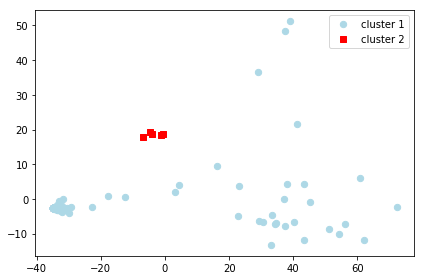

In [184]:
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)

    xy = smol_chunks_x_pca[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)

    xy = smol_chunks_x_pca[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Break train_smol up into chunks

In [208]:
def text_chunker(list_of_strings):
    new_list = []
    for item in list_of_strings:
        new_strings = textwrap.wrap(item, 1500)
        for item2 in new_strings:
            new_list.append(item2)
    return new_list

In [210]:
train_smol_chunks = text_chunker(train_smol)

In [211]:
len(train_smol_chunks)

845

In [242]:
count_vectorizer_chunks = CountVectorizer(ngram_range=(1, 3),  
                                   stop_words='english', token_pattern="\\b[a-z][a-z]+\\b")
count_vectorizer_chunks.fit(train_smol_chunks)
counts_chunks = count_vectorizer_chunks.transform(train_smol_chunks)

In [243]:
smol_dense_chunks = counts_chunks.todense()

In [246]:
smol_chunks_x_pca, smol_chunks_pca_obj = make_pca(smol_dense_chunks, 10)

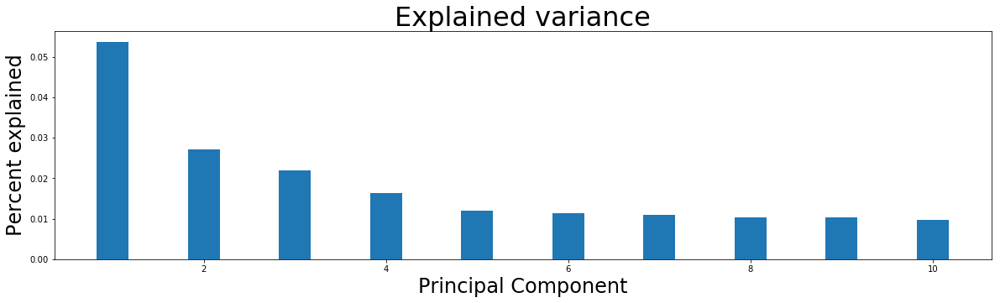

In [247]:
exp_var_bar(smol_chunks_pca_obj, 10)

In [249]:
t_chunks = smol_chunks_x_pca.T

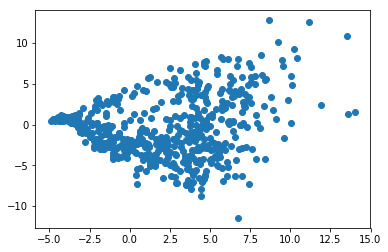

In [250]:
plt.scatter(t_chunks[0], t_chunks[1])

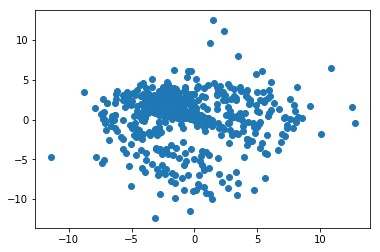

In [251]:
plt.scatter(t_chunks[1], t_chunks[2])

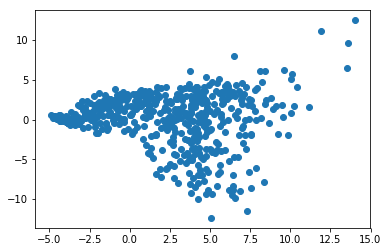

In [252]:
plt.scatter(t_chunks[0], t_chunks[2])

In [341]:
dbs_s_c_p = DBSCAN(eps = 4, min_samples=6, metric='euclidean') #3 and 4 are nice

In [342]:
y_dbs_s_c_p = dbs_s_c_p.fit_predict(smol_chunks_x_pca)

In [347]:
y_dbs_s_c_p[0]

2

In [343]:
core_samples_mask = np.zeros_like(dbs_s_c_p.labels_, dtype=bool)
core_samples_mask[dbs_s_c_p.core_sample_indices_] = True
labels = dbs_s_c_p.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)

Estimated number of clusters: 7


In [349]:
dbs_s_c_p.labels_ #these correspond to doc numbers- e.g. 4th doc is an outlier

array([ 2,  1,  0, -1, -1,  2,  2,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2, -1,  2,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2, -1,  2, -1, -1, -1, -1, -1, -1,  2, -1,  2,
        2,  2,  2,  2,  2,  2,  2,  2, -1,  2,  2,  2, -1, -1, -1,  2,  2,
       -1,  2,  2,  2, -1, -1,  2, -1, -1, -1, -1,  2,  2, -1,  2,  2,  2,
        2,  2,  2,  2,  2

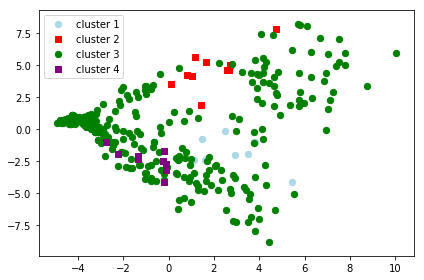

In [344]:
plt.scatter(smol_chunks_x_pca[y_dbs_s_c_p == 0, 0], smol_chunks_x_pca[y_dbs_s_c_p == 0, 1],
            c='lightblue', marker='o', s=40,
            label='cluster 1')
plt.scatter(smol_chunks_x_pca[y_dbs_s_c_p == 1, 0], smol_chunks_x_pca[y_dbs_s_c_p == 1, 1],
            c='red', marker='s', s=40,
            label='cluster 2')
plt.scatter(smol_chunks_x_pca[y_dbs_s_c_p == 2, 0], smol_chunks_x_pca[y_dbs_s_c_p == 2, 1],
            c='green', marker='o', s=40,
            label='cluster 3')
plt.scatter(smol_chunks_x_pca[y_dbs_s_c_p == 3, 0], smol_chunks_x_pca[y_dbs_s_c_p == 3, 1],
            c='purple', marker='s', s=40,
            label='cluster 4')
plt.legend()
plt.tight_layout()
plt.show()

/Users/hritter/anaconda/lib/python3.6/site-packages/matplotlib/lines.py:1206: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if self._markerfacecolor != fc:


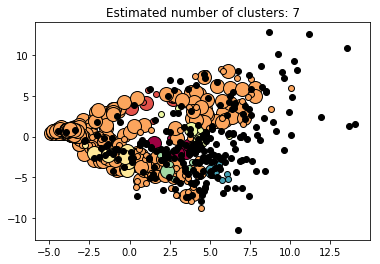

In [345]:
# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)

    xy = smol_chunks_x_pca[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)

    xy = smol_chunks_x_pca[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Gensim and Spacy

In [21]:
corpus = matutils.Sparse2Corpus(counts_transpose)

In [35]:
train_smol1 = train_smol[1].replace('\n', ' ')

In [36]:
train_smol1

'UNITED STATES ENVIRONMENTAL PROTECTION AGENCY  REGION 4 ATLANTA FEDERAL CENTER 61 FORSYTH STREET ATLANTA, GEORGIA  30303-8960 CERTIFIED MAIL RETURN RECEIPT REQUESTED Ms. Birdie  Simms, Office Manager Kelcas Petroleum Production  & Exploration P.O. Box 21345 Owensboro, KY 2304 SUBJ: Consent Agreement  and Final  Order: Docket No. CWA-04-2007-5002 Dear Ms. Simms: Enclosed is a copy  of the Consent Agreement and Final  Order (CAFO)  for the  above referenced matter.  This CAFO became effective on the date of filing with. the  Regional Hearing  Clerk as required by 40 C.F.R.sg22.6 and 22.31, and as indicated  on the Certificate of Service. The United States Environmental Protection  Agency (EPA) hereby notifies  you that the Expedited Settlement Agreement  has been  executed by both parties and  is binding on  EPA and you. Upon  receipt of your assessed  penalty of $500.00, EPA will  take no further action against  you for the  violations cited in the Settlement Agreement.  Your copy of t

In [42]:
print(summarize(train_smol1, ratio=0.05))

UNITED STATES ENVIRONMENTAL PROTECTION AGENCY  REGION 4 ATLANTA FEDERAL CENTER 61 FORSYTH STREET ATLANTA, GEORGIA  30303-8960 CERTIFIED MAIL RETURN RECEIPT REQUESTED Ms. Birdie  Simms, Office Manager Kelcas Petroleum Production  & Exploration P.O. Box 21345 Owensboro, KY 2304 SUBJ: Consent Agreement  and Final  Order: Docket No. CWA-04-2007-5002 Dear Ms. Simms: Enclosed is a copy  of the Consent Agreement and Final  Order (CAFO)  for the  above referenced matter.
." * ro On: July  8,2006 Time:18:30 ~n At: or near the intersection of KY Hy 1554 and Street Upon signing and returning this  Expedited Spill  Settlement Road in Daviess County, Kentucky,  Kelcas Petroleum  Agreement to EPA, Respondent  waives the opportunity for Production & Exploration (Respondent)  discharged 160 a hearing or appeal pursuant  to Section 3  11 of the Act, and  gallons of  oil in violation of  Section 31 1(b)(3) of the Clean consents  to EPA's approval of the Expedited  Settlement Water Act (the  Act), as not

In [46]:
print(keywords(train_smol1, ratio=0.05))

office
officer
respondent
region
regional
violations
violation
violate
violated
epa
payment
payments
enforcement
order
ordered
orders
mail
mailed
address
addresses
agreement
settlement
cwa
account
accounts
kelcas


In [48]:
nlp = spacy.load('en')

In [68]:
train_smol1_spacy = nlp.make_doc(train_smol1)

In [73]:
for ent in train_smol1_spacy.ents:
    print(ent, ent.label, ent.label_)

In [80]:
train_smol1_spacy = nlp(u'''UNITED STATES ENVIRONMENTAL PROTECTION AGENCY  REGION 4 ATLANTA FEDERAL CENTER 61 FORSYTH STREET ATLANTA, GEORGIA  30303-8960 CERTIFIED MAIL RETURN RECEIPT REQUESTED Ms. Birdie  Simms, Office Manager Kelcas Petroleum Production  & Exploration P.O. Box 21345 Owensboro, KY 2304 SUBJ: Consent Agreement  and Final  Order: Docket No. CWA-04-2007-5002 Dear Ms. Simms: Enclosed is a copy  of the Consent Agreement and Final  Order (CAFO)  for the  above referenced matter.  This CAFO became effective on the date of filing with. the  Regional Hearing  Clerk as required by 40 C.F.R.sg22.6 and 22.31, and as indicated  on the Certificate of Service. The United States Environmental Protection  Agency (EPA) hereby notifies  you that the Expedited Settlement Agreement  has been  executed by both parties and  is binding on  EPA and you. Upon  receipt of your assessed  penalty of $500.00, EPA will  take no further action against  you for the  violations cited in the Settlement Agreement.  Your copy of the executed agreement is enclosed. You must submit your payment within seven  (7) days of your receipt of this letter by either electronic funds transfer, certified  or cashiers check made  payable to "Environmental Protection Agency." The check and a letter accompanying  the check shall  reference the name  of the responsible party (Oil Spill Liability Trust Fund  -31 1, Kelcas Petroleum Production  & Exploration) and the EPA docket number  CWA-04-2007-5002, and shall  be sent depending  upon your preferred method of payment identified in Enclosure A. Internet Address (URL) http:llwww.epa.gov RecycledlRecyclable a Printed with Vegetable Oil Based Inks on Recycled  Paper (Minimum 30% Postconsumer) A copy  of the check shall simultaneously  be sent to at the time  Respondent shall  send separate copy of each check and a written statement that the payment is being made in accordance with this CAFO, to the  persons at  the following addresses:  Regional Hearing Clerk U.S. EPA - Region 4 61 Forsyth Street  Atlanta, Georgia  30303-8960 Me1 Rechtman at: U.S. EPA - Region 4 RCRAIOPA Enforcement & Compliance Branch RCRA Division 61 Forsyth Street, SW  Atlanta, Georgia  30303-8960 If you have any questions, please contact Me1 Rechtman at (404)562-8745. Sincerely, Narindar Kumar, Chief RCRAJOPA Enforcement & Compliance Branch  RCRA Division Enclosure: Expedited Settlement Agreement Enclosure A - Payment Information  cc: USCG ENCLOSURE A PAYMENT INFORMATION Wire Transfers SWIFT Address  MELNUS3P - (SWIFT address is only needed on  international transfers) Mellon Bank  AB A 04300026 1  Account 9109125 22 Morrow Drive Pittsburgh PA 15235 Contact - Patricia McKaveney at 412-234-5805 CHECK PAYMENTS US checks by regular US  postal service mail U.S. Environmental Protection  Agency P.O. Box 371099M Pittsburgh, PA 1525 1  Contact - Patricia McKaveney at 412-234-5805 For FedEx and other non-US Postal  Service express  mail the  correct address is: Mellon Client  Service Center ATTN: Shift Supervisor Lockbox 37 1099M Account 9109125 500 Ross  Street Pittsburgh, PA 15262-0001 CD cr=3 UNITED STATES ENVIRONMENTAL PROTECTION  AGENCY?( -$ 2 REGION 4 -I y, :- -p3 7 1 -a *- 1 61 FORSYTH STREET, ATLANTA,  GEORGIA 30303 - - - , Yo 7-3 c~ P- . i EXPEDITED SPILL SETTLEMENT AGREEMENT  kr~ 2.2 _ -. --; c-. -7 c-: -* - -*.-:.. i' -+v . ' DOCKET NO. CWA-04-2007-5002  I. - -, - r:? :,-- -. ." * ro On: July  8,2006 Time:18:30 ~n At: or near the intersection of KY Hy 1554 and Street Upon signing and returning this  Expedited Spill  Settlement Road in Daviess County, Kentucky,  Kelcas Petroleum  Agreement to EPA, Respondent  waives the opportunity for Production & Exploration (Respondent)  discharged 160 a hearing or appeal pursuant  to Section 3  11 of the Act, and  gallons of  oil in violation of  Section 31 1(b)(3) of the Clean consents  to EPA's approval of the Expedited  Settlement Water Act (the  Act), as noted on the attached ALLEGED without further notice.  CIVIL VIOLATIONS (Form), which is hereby incorporated  by reference. After this  Expedited Spill Settlement  Agreement becomes  effective, EPA will take no further action against the  EPA finds the Respondent's conduct  is subject to  the Respondent for the violations  of Section  31 1(b)(3) of the  discharge prohibition  of Section 3  11(b)(3) of the Act, as Act  described in the Form.  However, EPA does not waive  described in that  statute and  further described by 40 CFR any rights  to take  any enforcement action for  any other  5 110.3. The Respondent admits being subject  to Section past, present,  or future violations by  the Respondent  of 3 1  l(b)(3) and that  EPA has jurisdictionover the  Respondent Section 31 l(b)(3) of the  Act or of any other federal statute  and the  Respondent's conduct  as described in the  form. or regulation. By its  first signature,  EPA ratifies the  Respondent does not contest the Allegations  in the Form, Findings and  Alleged Violations  set forth in the Form. and waives any  objections it  may have to  EPA's jurisdiction. This Expedited Spill Settlement  Agreement is binding on EPA is authorized to enter into this  Expedited Spill the parties signing below,  and effective upon  EPA's filing Settlement Agreement under  the authority vested  in the of the document  with the Regional Hearing  Clerk. If the Administrator of  EPA by Section 3 1  l(b)(6)(B)(i) of the  Act, Respondent does  not sign  and return this Expedited  33 U.S.C. §1321(b)(6)(B)(i), as amended by the Oil Settlement as presented within  30 days of the date of  its Pollution Act of 1990,  and by 40 CFR §22.13(b). The receipt and submit  payment of the assessed penalty  , the parties enter into this  Expedited Spill  Settlement Agreement proposed  Expedited Settlement is  withdrawn without  in order to settle  civil violations  described in the  Form for a prejudice  to EPA's ability to file any other enforcement  penalty of $500.00. Respondent consents to the assessment action for the violations identified in the  Form. of this penalty.  APPROVED BY RESPONDENT: This Expedited Settlement is also subject  to the following terms and  conditions: Respondent certifies, subject  to civil Name (print):  and criminal penalties for  making a false  submission to the United States Government,  that it  has investigated the cause Title  (pri of the spill, it  has cleaned up  the spill pursuant to federal  requirements at  a cost of  $31 3 %, q7 , and it has taken  Signature corrective actions  that will prevent  future spills.  The Respondent also  by signature on this Expedited Spill  APPROVED BY EPA: Settlement Agreement agrees to  payment of the  penalty assessed. Do not enclose payment.  Upon receiving written  1 v LA/ execution of this Agreement,  Respondent shall submit Narindar Kumar, Chief  Date 3//9/07 payment within  7 days  by certified check  or electronic  funds RCRAIOPA Enforcement & Compliance Branch transfer for $500.00 payable to the  "US Environmental RCRA Division Protection Agency CWA-311". Instructions  on how to make this  payment will be included in the written notice that  IT IS  SO ORDERED: will be issued when the  Expedited Spill Settlement Agreement becomes effective.  Date 3/: 4,/7 Regional Judicial Officer  ALLEGED CIVIL VIOLATIONS  - DOCKET NO. CWA-04-2007-5002  1. Kelcas Petroleum Production  & Exploration, Respondent, is a  corporation organized  under the laws of Kentucky with  a place of business located  at 729 Maple  Heights Avenue, Owensboro,  KY 42304. The Respondent is a  person within the meaning  of Section 311(a)(7) of the Clean Water Act, 33 U.S.C.  $1321(a)(7). 2. Respondent is the owner of an onshore facility  within the meaning  of Section 31  1(a)(10) of the Act, 33 U.S.C. §1321(a)(10), which is the Posey Hancock  Lease located  at or near the intersection  of KY fighway 1554 and 5th Street Road  in Daviess County, Kentucky ('facility'). ,. ,. .. 3. Section 31  1(b)(3) of the Act prohibits the discharge of oil into  or upon the navigable1 '.'" waters of the United  States or adjoining shorelines  in such quantities that have been determined may be  harmful to the public health  or welfare or environment of the United  States. 4. For purposes  of Section 31 1(b)(3) and (b)(4) of the Act,  33 U.S.C.  $1321(b)(3) and (b)(4), discharges of oil into or  upon the navigable waters  of the United States in such quantities that have been determined may be harmful to the public health  or welfare or environment of the United States are defined in 40 C.F.R. $110.3 to include discharges of oil that (I) violate applicable water quality standards  or, (2) cause a  film or  a sheen upon or discoloration of the surface of the water or adjoining shorelines  or, (3) cause a  sludge or emulsion to be deposited beneath the surface  of the water or upon the adjoining shorelines. 5. On July 8,2006, Respondent discharged  an estimated 160 gallons  of oil as defined  in Section 3 1 l(a)(l) of the Act, 33 U.S.C. $1321(a)(l), and 40 C.F.R.  $110.1, from its  facility into or  upon the ditch which  flows into the Green River which flows into  the Ohio River and adjoining shorelines.  6. The Green River which flows into the  Ohio River is a "navigable water of the United States" and, as such is subject to the jurisdiction  of Section 31  1 of the Act as defined in Section 502(7) of the Act,  33 U.S.C.  $1362(7), and 40  C.F.R. $110.1.  7. Respondent's July 8,2006 discharge of oil from its facility caused  a sheen upon or discoloration of the surface of the adjoining shoreline  of the Green  River which flows into the Ohio River or caused  a sludge or emulsion to be deposited beneath  the surface, and therefore, was in a quantity that  has been determined may be harmful under 40  C.F.R. $1 10.3. .,, .. , ,..." urvvll r-. vvl vlll~ll 11~~~ IIILU LIIC UIIIU niver ana aajolnlng SnOrellneS in a quantity that has  been determined may be harmful under  40 C.F.R.  $1 10.3 violated  Section 31 1(b)(3) of the Act. Pursuant to Section 31 l(b)(6)(B)(i) of the Act, and  40 C.F.R.19.4, the Respondent  is liable for civil penalties  of up to $1 1,000 per violation, up to a  maximum of $32,500. Docket No. CWA-04-2007-5002 CERTIFICATE OF  SERVICE The undersigned certifies that a  true and correct copy  of the attached Consent Agreement and Final Order, in the Matter  of Kelcas Petroleum Production  & Exploration, Docket  No. CWA-04-2007-5002 (filed with the Regional  Hearing Clerk  on & 2 1 7flfl72007) was served on 1.m 2 1 m07 in the manner specified  to each of the persons set  forth below: Birdie Simms,  Office Manager Via Certified  Mail, Kelcas Petroleum  Production & Exploration Return Requested  P.O. Box 21345 Owensboro, KY 42304 Victor Weeks, Risk Management Plan  Coordinator Via EPA's Internal Mail  EPCRA Enforcement Section U.S. EPA, Region 4 6 1  Forsyth St. Atlanta, GA 30303 Me1 Rechtman RCRA OPA  Enforcement & Compliance Branch U.S. EPA - Region 4 61 Forsyth Street Atlanta, GA 30303 Date: 347-07 Via EPA' s Internal Mail Patricia A. Bullock, Regional  Hearing clerk- United States Environmental Protection Agency, Region 4 Atlanta Federal Center  6 1  Forsyth Street, S.W. Atlanta, GA 30303 (404) 562-95 1 1  EPA ACCOUNTS RECEIVABLE CONTROL  NUMBER FORM PAYMENT DUE DATE: TO BE COMPLETED BY THE ORGINATING OFFICE: (Attach a copy d the final order and transmittal letter  to Defendantmespondent) This form was originated by: Me1 Rechtman on 2/21/2007 (Name) (Date) in the ROECB at 4041562-8745 (Office) (Phone Number) Non-SF Judicial OrderIConsent Decree USA0 COLLECTS SF Judicial Order/Consent Decree DOJ COLLECTS Other Receivable This is an original debt Administrative OrderIConsent Agreemeot FMO COLLECIS PAYMENT Oversight Billing - Cost Package required: Sent with bill Not sent with bi OvMight Bii - Cost Package not required This is a modification PAYEE: Kelcas Petroleum Production  & Exploration The Total Dollar  Amount of the receivable; $500.00 (If installments, attach schedule of amounts and  respective due dates. See other side of this form.) The Case Docket Number: CWA-04-2007-5002 The Site Specific Superfund Account Number:  The Designated  RegionaVHeadquarters Program Office: Waste To Be Com~leted By Cincinnati Finance  Center The IFMS Accounts Receivable  Control Number is: Date: 00/00/2006 DISTRIBUTION: A. JUDICIAL ORDERS: Copies of this form with an attached copy of the front page of the FINAL JUD- Should be mailed to: 1. Debt Tracking Officer 2. Originatinp Once @AD) Environmental Enforcement Section  3. Designated Program Office Department of Justice RM 1647 P.O. Box 7611, Bedamin Franklin Station  Washington, D.C. 20044 B. ADMINISTRATIVE ORDERS:  Copies of thls form with an attached copy of the front page of the Admlnlstretive Order should be to: 1. Originating Office 2. Regional Hearing Clerk 3. Derignated Progam Omce 4. Regional Counsel  @AD''')

In [96]:
for ent in train_smol1_spacy.ents:
    if ent.label_== 'LAW':
        print(ent, ent.label_)

Section 31 1(b)(3) of the LAW
Section 3 1 LAW
Section 311(a)(7 LAW
the Clean Water Act LAW
Section 31 LAW
Section 3 1 l(a)(l) of the Act LAW
Section 31 LAW
Section 502(7 LAW
Section 31 1(b)(3) of the Act LAW
Section 31 LAW
Region 4 6 1  Forsyth St. Atlanta LAW


In [97]:
for ent in train_smol1_spacy.ents:
    if ent.label_== 'ORG':
        print(ent, ent.label_)

STATES ENVIRONMENTAL PROTECTION ORG
Simms, Office Manager Kelcas Petroleum Production ORG
& Exploration P.O. ORG
Consent Agreement ORG
the Consent Agreement ORG
CAFO ORG
the Certificate of Service ORG
EPA ORG
the Expedited Settlement Agreement ORG
EPA ORG
EPA ORG
the Settlement Agreement ORG
"Environmental Protection Agency ORG
  ORG
Oil Spill Liability Trust Fund ORG
Kelcas Petroleum Production ORG
EPA ORG
URL ORG
Vegetable Oil ORG
CAFO ORG
Me1 Rechtman ORG
Enforcement & Compliance Branch ORG
RCRA Division Enclosure ORG
Expedited Settlement Agreement Enclosure A - Payment Information ORG
Mellon Bank  AB ORG
Morrow Drive Pittsburgh ORG
U.S. Environmental Protection ORG
Mellon Client  Service Center ORG
KY Hy ORG
 Kelcas Petroleum ORG
EPA ORG
Production & Exploration (Respondent) ORG
Act ORG
EPA ORG
Expedited Spill Settlement ORG
EPA ORG
EPA ORG
Respondent ORG
Act ORG
EPA ORG
CFR ORG
 the Respondent ORG
EPA ORG
EPA ORG
EPA ORG
This Expedited Spill Settlement ORG
EPA ORG
EPA ORG
Settleme